In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
import math
import dask.dataframe as dd

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from string import ascii_letters


In [2]:
# Load data
df = pd.read_csv("ca-dealers-used.csv",dtype={'fuel_type': 'object', 'engine_block': 'object'})

In [3]:
df.dtypes

id               object
vin              object
price           float64
miles           float64
stock_no         object
year            float64
make             object
model            object
trim             object
body_type        object
vehicle_type     object
drivetrain       object
transmission     object
fuel_type        object
engine_size     float64
engine_block     object
seller_name      object
street           object
city             object
state            object
zip              object
dtype: object

In [4]:
len(df)

393603

In [5]:
df.head(5)

,id,vin,price,miles,stock_no,year,make,model,trim,body_type,...,drivetrain,transmission,fuel_type,engine_size,engine_block,seller_name,street,city,state,zip
0,b39ea795-eca9,19UNC1B01HY800062,179999.0,9966.0,V-P4139,2017.0,Acura,NSX,Base,Coupe,...,4WD,Automatic,Electric / Premium Unleaded,3.5,V,edmundston honda,475 Rue Victoria,Edmundston,NB,E3V 2K7
1,026cb5b1-6e3e,19UNC1B02HY800023,179995.0,5988.0,PPAP70374,2017.0,Acura,NSX,Base,Coupe,...,4WD,Automatic,Electric / Premium Unleaded,3.5,V,garage daniel lessard,2795 Route-du-prsident-kennedy,Notre-dame-des-pins,QC,G0M 1K0
2,5cd5d5b2-5cc2,19UNC1B02HY800071,168528.0,24242.0,B21085,2017.0,Acura,NSX,Base,Coupe,...,4WD,Automatic,Electric / Premium Unleaded,3.5,V,lougheed acura,1388 Lougheed Highway,Coquitlam,BC,V3K 6S4
3,b32473ed-5922,19UNC1B02LY800001,220000.0,6637.0,AP5333,2020.0,Acura,NSX,Base,Coupe,...,4WD,Automatic,Electric / Premium Unleaded,3.5,V,drive autogroup,1305 Parkway Suite 600,Pickering,ON,L1V 3P2
4,ac40c9fc-0676,19UNC1B02LY800001,220000.0,6637.0,AP5333,2020.0,Acura,NSX,Base,Coupe,...,4WD,Automatic,Electric / Premium Unleaded,3.5,V,acura pickering,575 Kingston Road,Pickering,ON,L1V 3N7


In [6]:
# Only select records from Toronto
df=df[df.state == "ON"]

In [7]:
df=df[df.city == "Toronto"]

In [8]:
# drop irrelevant columns for this research
drop_columns = ['id', 'vin', 'stock_no', 'seller_name','street','city','state','zip']

In [9]:
df = df.drop(columns = drop_columns)

In [10]:
# EDA analysis
# check data types
df.dtypes

price           float64
miles           float64
year            float64
make             object
model            object
trim             object
body_type        object
vehicle_type     object
drivetrain       object
transmission     object
fuel_type        object
engine_size     float64
engine_block     object
dtype: object

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14998 entries, 39 to 393573
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         13811 non-null  float64
 1   miles         13229 non-null  float64
 2   year          14998 non-null  float64
 3   make          14998 non-null  object 
 4   model         14807 non-null  object 
 5   trim          13954 non-null  object 
 6   body_type     13442 non-null  object 
 7   vehicle_type  13278 non-null  object 
 8   drivetrain    14262 non-null  object 
 9   transmission  14276 non-null  object 
 10  fuel_type     12615 non-null  object 
 11  engine_size   12607 non-null  float64
 12  engine_block  12554 non-null  object 
dtypes: float64(4), object(9)
memory usage: 1.6+ MB


In [12]:
# Check missing values
missing_values_count = df.isnull().sum()
missing_values_count

price           1187
miles           1769
year               0
make               0
model            191
trim            1044
body_type       1556
vehicle_type    1720
drivetrain       736
transmission     722
fuel_type       2383
engine_size     2391
engine_block    2444
dtype: int64

In [13]:
df['price'].describe()

count     13811.000000
mean      25069.024835
std       21359.905212
min           0.000000
25%       14855.500000
50%       20900.000000
75%       29950.000000
max      589000.000000
Name: price, dtype: float64

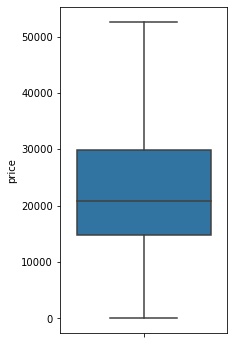

In [14]:
# Boxplot for price
plt.figure(figsize=(3,6))
sns.boxplot(y='price', data=df, showfliers=False);

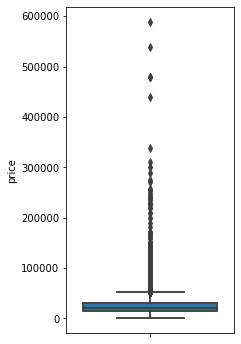

In [15]:
# Box plot for price with outliers, we can see that there are a lot extreme high prices
plt.figure(figsize=(3,6))
sns.boxplot(y='price', data=df, showfliers=False)
sns.boxplot(y='price', data=df);

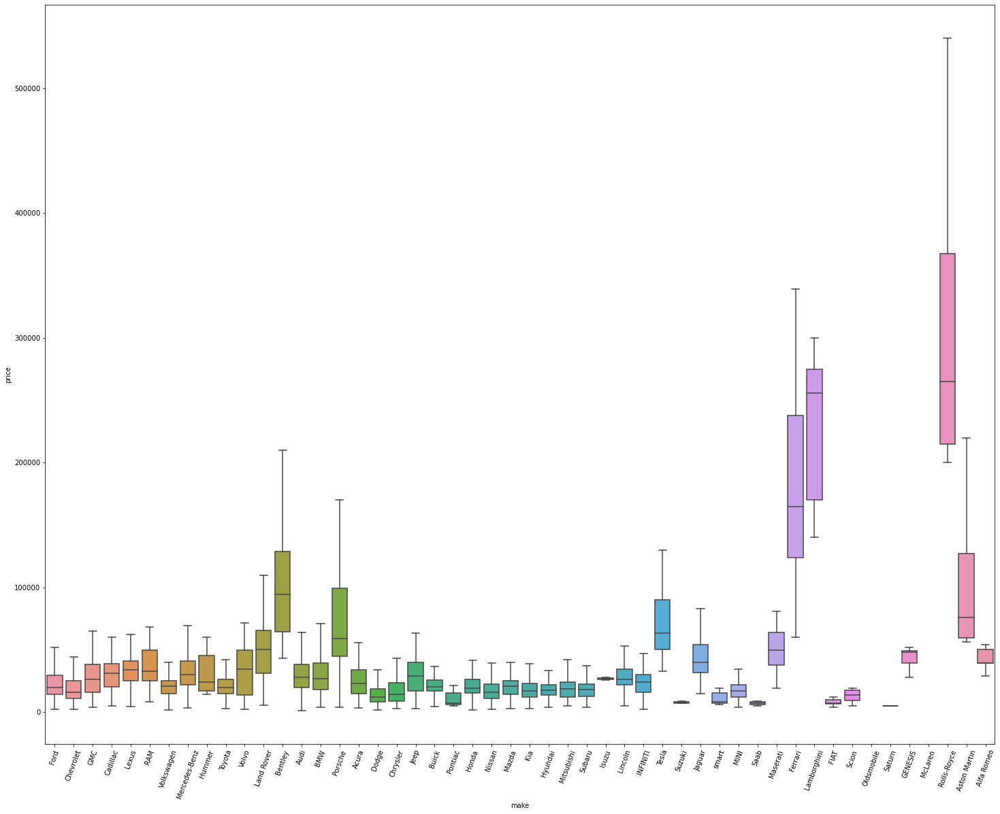

In [16]:
# Prices by different brands, some brands have high average prices and max prices
plt.figure(figsize=(25,20))
plt.xticks(rotation=70)
sns.boxplot(y='price', x='make', data=df, showfliers=False)

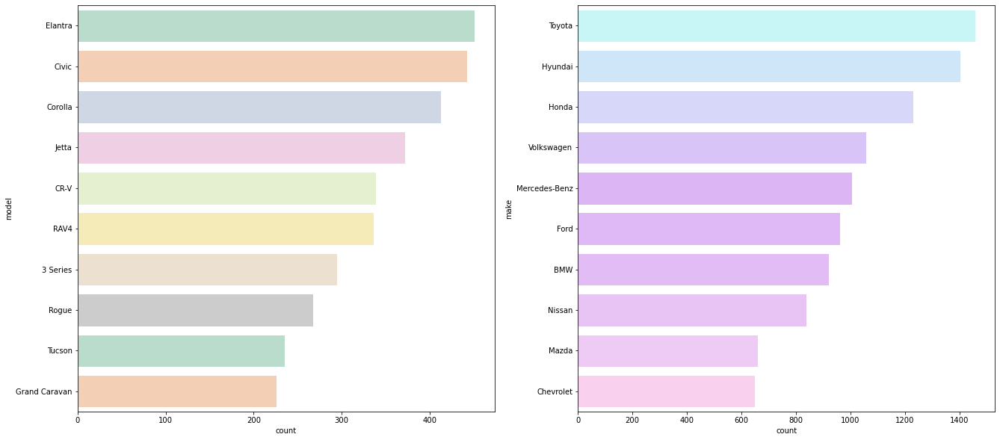

In [17]:
# Count by top 10 most popular brand and model
colors = ["#C0FDFF", "#C8E7FF","#D0D1FF","#D8BBFF","#DEAAFF","#E2AFFF","#E5B3FE","#ECBCFD","#F3C4FB","#FFCBF2"]
sns.set_palette(sns.color_palette(colors))


fig, ax =plt.subplots(1,2,figsize=(22, 10))
sns.set(rc={"axes.facecolor":"#fcfcfc", "axes.grid":False,'xtick.labelsize':20,'ytick.labelsize':20})
sns.countplot(y ='make',data = df,order=df.make.value_counts().iloc[:10].index, ax = ax[1],palette = colors) 
sns.countplot(y ='model',data = df,order=df.model.value_counts().iloc[:10].index, ax= ax[0],palette = "Pastel2")
fig.show()

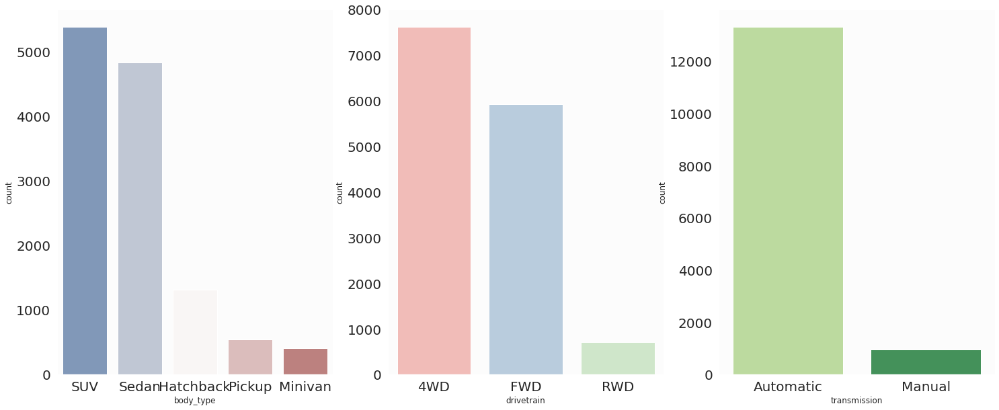

In [18]:
# Countplot by body_type, drivetrain and transmission
fig, ax =plt.subplots(1,3,figsize=(25, 10))
sns.set(rc={"axes.facecolor":"#fcfcfc", "axes.grid":False,'xtick.labelsize':15,'ytick.labelsize':15})
sns.countplot(x ='body_type',data = df,order=df.body_type.value_counts().iloc[:5].index, ax = ax[0],palette="vlag")
sns.countplot(x ='drivetrain',data = df,order=df.drivetrain.value_counts().iloc[:5].index, ax = ax[1],palette="Pastel1")
sns.countplot(x ='transmission',data = df,order=df.transmission.value_counts().iloc[:5].index, ax = ax[2],palette="YlGn")
fig.show()

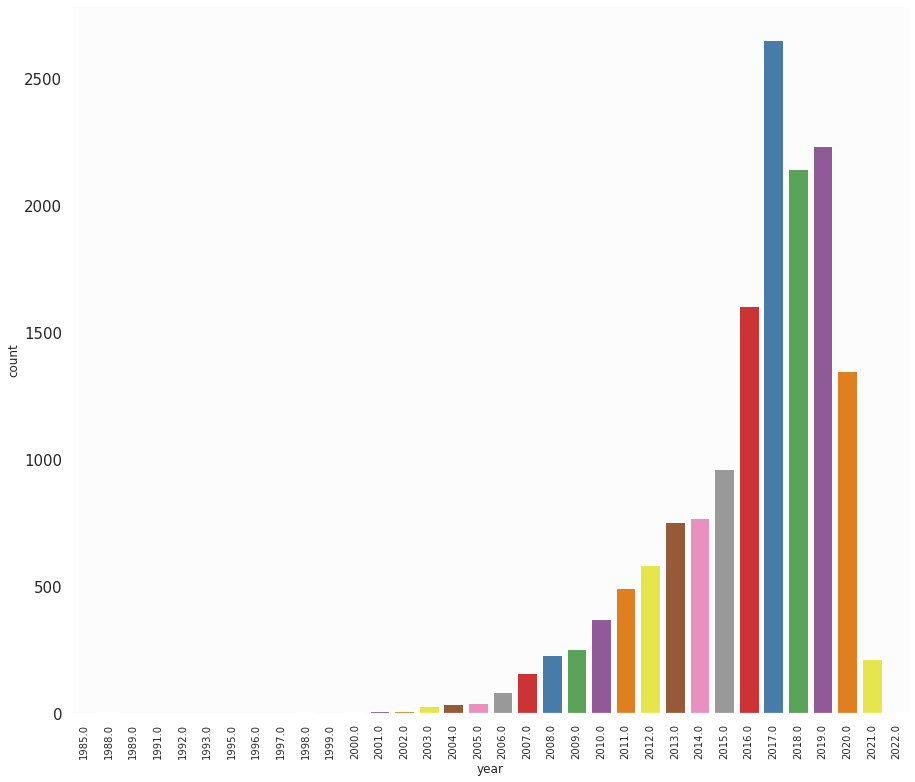

In [19]:
# Count by year
plt.figure(figsize=(15, 13))
ax = sns.countplot(x = 'year', data=df, palette='Set1')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90,fontsize=10);

In [20]:
# Sample data:
df.tail(20)

,price,miles,year,make,model,trim,body_type,vehicle_type,drivetrain,transmission,fuel_type,engine_size,engine_block
393008,9990.0,96588.0,2013.0,Hyundai,Sonata Hybrid,Hybrid,Sedan,Car,FWD,Automatic,Electric / Unleaded,2.4,I
393022,NaN,154300.0,2013.0,Hyundai,Sonata Hybrid,Hybrid,Sedan,Car,FWD,Automatic,Electric / Unleaded,2.4,I
393040,38998.0,15365.0,2020.0,Hyundai,Sonata Hybrid,SEL,Sedan,Car,FWD,Automatic,Electric / Unleaded,2.0,I
393067,8995.0,112000.0,2012.0,Kia,Optima,Hybrid,Sedan,Car,FWD,Automatic,Electric / Unleaded,2.4,I
393134,16999.0,103590.0,2016.0,Kia,Optima,EX Hybrid,Sedan,Car,FWD,Automatic,Electric / Unleaded,2.4,I
393144,14950.0,90000.0,2016.0,Kia,Optima,EX Hybrid,Sedan,Car,FWD,Automatic,Electric / Unleaded,2.4,I
393177,13888.0,97123.0,2015.0,Kia,Optima,EX Hybrid,Sedan,Car,FWD,Automatic,Electric / Unleaded,2.4,I
393232,18990.0,64476.0,2017.0,Kia,Optima,EX Plug-In Hybrid,Sedan,Car,FWD,Automatic,Electric / Unleaded,2.0,I
393235,18990.0,64476.0,2017.0,Kia,Optima,EX Plug-In Hybrid,Sedan,Car,FWD,Automatic,Electric / Unleaded,2.0,I
393236,18990.0,64476.0,2017.0,Kia,Optima,EX Plug-In Hybrid,Sedan,Car,FWD,Automatic,Electric / Unleaded,2.0,I


In [21]:
# Data cleaning and preprocessing:
# Lets drop records without prices, since these records will be useless for our analysis
df_tor=df.dropna(subset=['price'])

In [22]:
pip install pandas-profiling

  Using cached pandas_profiling-3.1.0-py2.py3-none-any.whl (261 kB)
  Using cached multimethod-1.6-py3-none-any.whl (9.4 kB)
  Using cached tqdm-4.62.3-py2.py3-none-any.whl (76 kB)
  Using cached visions-0.7.4-py3-none-any.whl (102 kB)
  Using cached phik-0.12.0-cp37-cp37m-manylinux2010_x86_64.whl (675 kB)
  Using cached tangled_up_in_unicode-0.1.0-py3-none-any.whl (3.1 MB)
  Using cached pydantic-1.8.2-cp37-cp37m-manylinux2014_x86_64.whl (10.1 MB)
  Using cached requests-2.26.0-py2.py3-none-any.whl (62 kB)
Processing ./.cache/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655/htmlmin-0.1.12-py3-none-any.whl
  Using cached missingno-0.5.0-py3-none-any.whl (8.8 kB)
  Using cached joblib-1.0.1-py3-none-any.whl (303 kB)
  Using cached MarkupSafe-2.0.1-cp37-cp37m-manylinux2010_x86_64.whl (31 kB)
Processing ./.cache/pip/wheels/4c/d5/59/5e3e297533ddb09407769762985d134135064c6831e29a914e/ImageHash-4.2.1-py2.py3-none-any.whl
  Using cached typing_extensions-3.10.0.2-py3-non

In [23]:
# Using pandas profiling to inspect our dataset. Pandas profiling gives you very detailed information on variables and correlations
from pandas_profiling import ProfileReport as pp

In [24]:
profile = pp(df_tor)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [25]:
profile.to_file("profile_bf_cleaning_tor.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [26]:
rr=sorted(df_tor["price"])
quantile1, quantile3= np.percentile(rr,[1,99])
print(quantile1,quantile3)

4490.0 93999.0


In [27]:
# There are extreame values exist on both side of the distribution. Also the difference between 75% value and max value is too large so lets leave 1% values at both ends of a distribution.These values either do not make sense or will significantly impact our models.
# Remove records with prices <4490 and price > 93999. 
df_tor=df_tor[(df_tor.price < 93999) & (df_tor.price > 4490 )]

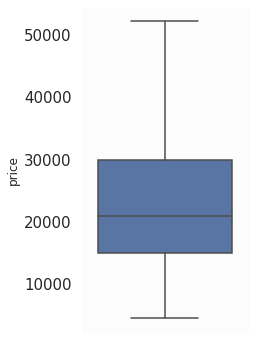

In [28]:
plt.figure(figsize=(3,6))
sns.boxplot(y='price', data=df_tor, showfliers=False);

In [29]:
# Any car that was made before 1990 should be considered as vintage or classic car. There is a special group of people who colloect these type cars,however, these cars should not be inlcuded in this study. cars made in 2022 are probably entered by mistake
df_tor=df_tor[(df_tor.year > 1990) & (df_tor.year < 2022 )]

In [30]:
# Below attributes have missing values, they need to be cleaned up:
missing_values_count = df_tor.isnull().sum()
missing_values_count

price              0
miles           1557
year               0
make               0
model            168
trim             947
body_type       1418
vehicle_type    1572
drivetrain       665
transmission     654
fuel_type       2171
engine_size     2177
engine_block    2217
dtype: int64

In [31]:
len(df_tor)

13523

In [32]:
# The trim attributes has too much inconsistent data with high cardinality, so we will drop this column.
df_tor=df_tor.drop(["trim"],axis=1)

In [33]:
# There are records with missing values in 'model'.These records have to be removed as model can't be replaced easily without changing the reality of the instances.
df_tor=df_tor.dropna(subset=['model'])

In [34]:
missing_values_count = df_tor.isnull().sum()
missing_values_count

price              0
miles           1544
year               0
make               0
model              0
body_type       1256
vehicle_type    1405
drivetrain       652
transmission     641
fuel_type       2003
engine_size     2009
engine_block    2049
dtype: int64

In [35]:
# I am droping records with missnig drivetrain and transmission as well since they are only account for less than 1% of total records.
df_tor=df_tor.dropna(subset=['drivetrain','transmission'])

In [36]:
missing_values_count = df_tor.isnull().sum()
missing_values_count

price              0
miles           1439
year               0
make               0
model              0
body_type       1169
vehicle_type    1313
drivetrain         0
transmission       0
fuel_type       1338
engine_size     1375
engine_block    1394
dtype: int64

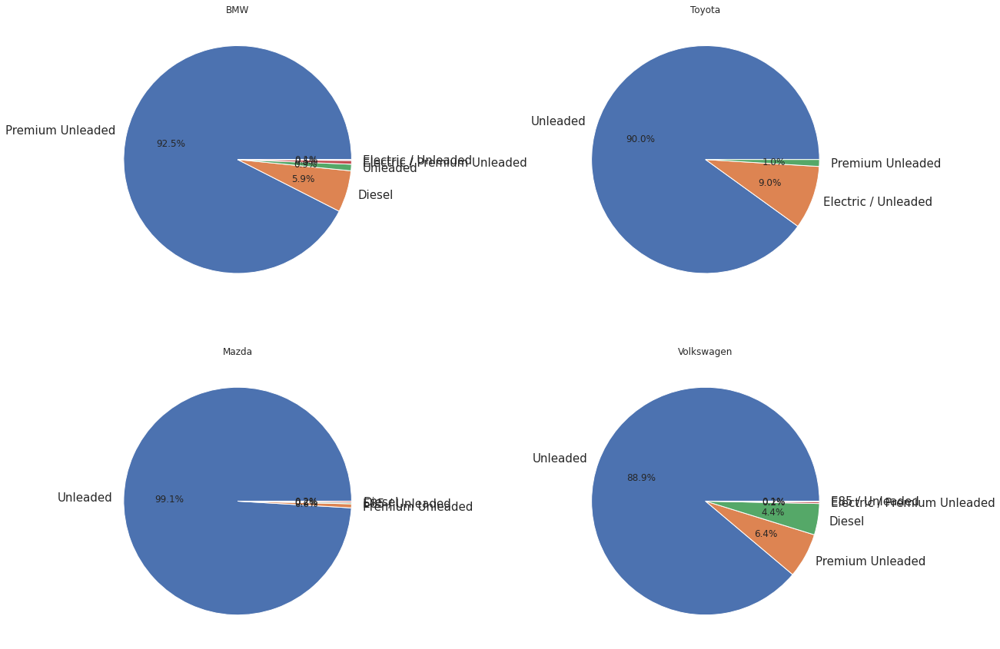

In [37]:
# Fuel_type can be an important feature, instead of simply dropping all the records and also for the purpose of learning, lets try to replace these missing values.
# Panadas profiling indicates that fuel_type has a relative high correlation with make. We will select 4 random car brands and compare its fuel_type in pie charts.
# Pie charts show that these brands prefer to produce cars with certain fuel_type
plt.figure(figsize=(20,15))
plt.subplot(221)
df_tor["fuel_type"][df_tor["make"]=='BMW'].value_counts().plot.pie(autopct = '%.1f%%', title="BMW")
plt.axis('off')

plt.subplot(222)
df_tor["fuel_type"][df_tor["make"]=='Toyota'].value_counts().plot.pie(autopct = '%.1f%%', title="Toyota")
plt.axis('off')

plt.subplot(223)
df_tor["fuel_type"][df_tor["make"]=='Mazda'].value_counts().plot.pie(autopct = '%.1f%%', title="Mazda")
plt.axis('off')

plt.subplot(224)
df_tor["fuel_type"][df_tor["make"]=='Volkswagen'].value_counts().plot.pie(autopct = '%.1f%%', title="Volkswagen")
plt.axis('off')

plt.show()

In [38]:
# The approach here is to replace missing fuel_type with the most common value for each brand. We first try to create a list with each brand and its most commonly used fuel_type
fuel_count = df_tor.groupby(['fuel_type','make'], sort=True).size().reset_index(name='Count').sort_values(['make','Count'],ascending=False).groupby(['make']).first()

In [39]:
fuel_count.reset_index(inplace=True)

In [40]:
fuel_pair = fuel_count[['make','fuel_type']]

In [41]:
fuel_replace = pd.Series(fuel_pair.fuel_type.values,index = fuel_pair.make)

In [42]:
# Replace with missing fuel_type:
df_tor['fuel_type'] = df_tor['fuel_type'].fillna(df_tor['make'].apply(lambda x: fuel_replace.get(x)))

In [43]:
# Miles
# miles has a strong negative correlation with year as shown below:
df_tor.corr()

,price,miles,year,engine_size
price,1.000000,-0.476104,0.474156,0.311024
miles,-0.476104,1.000000,-0.717641,0.273222
year,0.474156,-0.717641,1.000000,-0.291305
engine_size,0.311024,0.273222,-0.291305,1.000000


In [44]:
# Replacing missing values in miles with median value of each year.
miles_median =  dict(df_tor.groupby('year')['miles'].median())

In [45]:
df_tor['miles'] = df_tor['miles'].fillna(df_tor['year'].apply(lambda x: miles_median.get(x)))

In [46]:
# Removing the left missing values in miles because no information available for that year.
df_tor=df_tor.dropna(subset=['miles'])

In [47]:
missing_values_count = df_tor.isnull().sum()
missing_values_count

price              0
miles              0
year               0
make               0
model              0
body_type       1169
vehicle_type    1313
drivetrain         0
transmission       0
fuel_type          0
engine_size     1375
engine_block    1394
dtype: int64

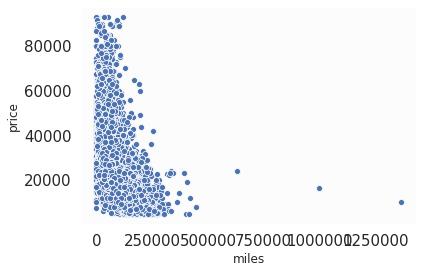

In [48]:
# Lets see if miles has any outliers
ax = sns.scatterplot(x="miles", y="price", data=df_tor)
ax.get_xaxis().get_major_formatter().set_scientific(False)
ax.get_yaxis().get_major_formatter().set_scientific(False)

In [49]:
# From the scatterplot above we can easily see some outliers, let's first only keep cars between 1 miles and 500000 miles.
df_tor=df_tor[(df_tor.miles < 500000) & (df_tor.miles > 1 )]

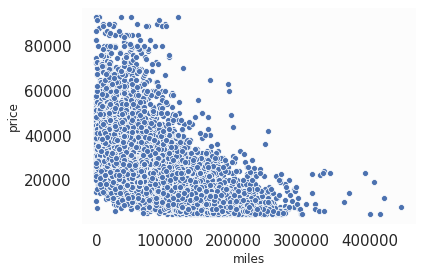

In [50]:
#Miles is another important feature, lets see if it has any outliers:
ax = sns.scatterplot(x="miles", y="price", data=df_tor)
ax.get_xaxis().get_major_formatter().set_scientific(False)
ax.get_yaxis().get_major_formatter().set_scientific(False)

In [51]:
# There are still several instances where miles > 300000, lets remove those as well
df_tor=df_tor[(df_tor.miles < 300000) & (df_tor.miles > 1 )]

In [52]:
# Body_type
# Pandas profiling indicates that body type has a high correltion with vehicle type, we will replace missing body_type based on vehicle type. Lets take a look at these two attributes together.
df_bt = df_tor.groupby(['vehicle_type','body_type'], sort=True).size().reset_index(name='Count')
df_bt

,vehicle_type,body_type,Count
0,Car,Car Van,1
1,Car,Convertible,84
2,Car,Coupe,293
3,Car,Hatchback,1008
4,Car,Micro Car,6
5,Car,Mini Mpv,20
6,Car,SUV,1
7,Car,Sedan,4127
8,Car,Targa,4
9,Car,Wagon,107


In [53]:
# We find out that there are records missing both attributes
df_tor.loc[(df_tor['vehicle_type'].isna()) & (df_tor['body_type'].isna())].count()

price           1154
miles           1154
year            1154
make            1154
model           1154
body_type          0
vehicle_type       0
drivetrain      1154
transmission    1154
fuel_type       1154
engine_size        0
engine_block       0
dtype: int64

In [54]:
# Lets drop these records because the values cant be replaced by the approach we are using.
df_tor=df_tor.dropna(subset=['vehicle_type','body_type'],how = 'all')

In [55]:
missing_values_count = df_tor.isnull().sum()
missing_values_count

price             0
miles             0
year              0
make              0
model             0
body_type        11
vehicle_type    155
drivetrain        0
transmission      0
fuel_type         0
engine_size     217
engine_block    236
dtype: int64

In [56]:
len(df_tor)

11489

In [57]:
# Replacing missing body_type based on vehicle type
df_bodytype = df_tor.groupby(['vehicle_type','body_type'], sort=True).size().reset_index(name='Count')
df_bodytype

,vehicle_type,body_type,Count
0,Car,Car Van,1
1,Car,Convertible,84
2,Car,Coupe,293
3,Car,Hatchback,1008
4,Car,Micro Car,6
5,Car,Mini Mpv,20
6,Car,SUV,1
7,Car,Sedan,4127
8,Car,Targa,4
9,Car,Wagon,107


In [58]:
# The approach is to replace the missing value with most common body type for each vehicle type
df_tor.loc[(df_tor['vehicle_type'] == 'Car') & (df_tor['body_type'].isna()),'body_type'] = 'Sedan'
df_tor.loc[(df_tor['vehicle_type'] == 'Truck') & (df_tor['body_type'].isna()),'body_type'] = 'SUV'

In [59]:
# Now lets deal with missing vehicle type, similarly we will replace missing vehicle type based on body_type:
df_vechile = df_tor.groupby(['body_type','vehicle_type'], sort=True).size().reset_index(name='Count')
df_vechile
# We can see that in most cases, each body_type corresponding to one vehicle type. Some incosistent data points are probably entered by mistake.

,body_type,vehicle_type,Count
0,Car Van,Car,1
1,Car Van,Truck,8
2,Cargo Van,Truck,111
3,Chassis Cab,Truck,10
4,Convertible,Car,84
5,Coupe,Car,293
6,Cutaway,Truck,22
7,Hatchback,Car,1008
8,Micro Car,Car,6
9,Mini Mpv,Car,20


In [60]:
# Lets first drop these inconsistent records:
df_tor = df_tor.drop(df_tor[(df_tor['body_type'] == 'Car Van') & (df_tor['vehicle_type'] == 'Car')].index)

In [61]:
df_tor = df_tor.drop(df_tor[(df_tor['body_type'] == 'Mini Mpv') & (df_tor['vehicle_type'] == 'Truck')].index)

In [62]:
df_tor = df_tor.drop(df_tor[(df_tor['body_type'] == 'SUV') & (df_tor['vehicle_type'] == 'Car')].index)

In [63]:
# Replacing missing vehicle type based on its body type
df_vechile = df_tor.groupby(['body_type','vehicle_type'], sort=True).size().reset_index(name='Count')
df_vechile

,body_type,vehicle_type,Count
0,Car Van,Truck,8
1,Cargo Van,Truck,111
2,Chassis Cab,Truck,10
3,Convertible,Car,84
4,Coupe,Car,293
5,Cutaway,Truck,22
6,Hatchback,Car,1008
7,Micro Car,Car,6
8,Mini Mpv,Car,20
9,Minivan,Truck,336


In [64]:
vechile_pair = df_vechile[['body_type','vehicle_type']]
vechile_replace = pd.Series(vechile_pair.vehicle_type.values,index = vechile_pair.body_type)
df_tor['vehicle_type'] = df_tor['vehicle_type'].fillna(df_tor['body_type'].apply(lambda x: vechile_replace.get(x)))

In [65]:
missing_values_count = df_tor.isnull().sum()
missing_values_count

price             0
miles             0
year              0
make              0
model             0
body_type         0
vehicle_type      1
drivetrain        0
transmission      0
fuel_type         0
engine_size     216
engine_block    235
dtype: int64

In [66]:
# dropping that one record since no information is available
df_tor=df_tor.dropna(subset=['vehicle_type'])

In [67]:
# Engine_block
# Lets first change engine block of all electric cars to 'N/A'
df_tor.loc[df_tor.fuel_type == 'Electric', 'engine_block'] = 'N/A'

In [68]:
# Pandas Profiling report indicates engine_block is highly correlated with car makes. We will replace the missing values with most commonly used engine block type

In [69]:
block_count = df_tor.groupby(['engine_block','make'], sort=True).size().reset_index(name='Count').sort_values(['make','Count'],ascending=False).groupby(['make']).first()

In [70]:
block_count.reset_index(inplace=True)

In [71]:
block_pair = block_count[['make','engine_block']]

In [72]:
block_replace = pd.Series(block_pair.engine_block.values,index = block_pair.make)
df_tor['engine_block'] = df_tor['engine_block'].fillna(df_tor['make'].apply(lambda x: block_replace.get(x)))

In [73]:
missing_values_count = df_tor.isnull().sum()
missing_values_count

price             0
miles             0
year              0
make              0
model             0
body_type         0
vehicle_type      0
drivetrain        0
transmission      0
fuel_type         0
engine_size     215
engine_block      6
dtype: int64

In [74]:
# dropping those 6 records since no information is available
df_tor=df_tor.dropna(subset=['engine_block'])

In [75]:
# Engine_size
# Lets first change engine size of all electric cars to 0
df_tor.loc[df_tor.fuel_type == 'Electric', 'engine_size'] = 0

In [76]:
# Pandas Profiling report indicates engine_block is highly correlated with engine_block . We will replace the missing values with most commonly used engine size for each engine block
size_count = df_tor.groupby(['engine_size','engine_block'], sort=True).size().reset_index(name='Count').sort_values(['engine_block','Count'],ascending=False).groupby(['engine_block']).first()

In [77]:
size_count.reset_index(inplace=True)

In [78]:
size_pair = size_count[['engine_block','engine_size']]

In [79]:
size_replace = pd.Series(size_pair.engine_size.values,index = size_pair.engine_block)

In [80]:
df_tor['engine_size'] = df_tor['engine_size'].fillna(df_tor['engine_block'].apply(lambda x: size_replace.get(x)))

In [81]:
missing_values_count = df_tor.isnull().sum()
missing_values_count

price           0
miles           0
year            0
make            0
model           0
body_type       0
vehicle_type    0
drivetrain      0
transmission    0
fuel_type       0
engine_size     0
engine_block    0
dtype: int64

In [82]:
len(df_tor)

11476

In [83]:
df_tor.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11476 entries, 446 to 393573
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         11476 non-null  float64
 1   miles         11476 non-null  float64
 2   year          11476 non-null  float64
 3   make          11476 non-null  object 
 4   model         11476 non-null  object 
 5   body_type     11476 non-null  object 
 6   vehicle_type  11476 non-null  object 
 7   drivetrain    11476 non-null  object 
 8   transmission  11476 non-null  object 
 9   fuel_type     11476 non-null  object 
 10  engine_size   11476 non-null  float64
 11  engine_block  11476 non-null  object 
dtypes: float64(4), object(8)
memory usage: 1.1+ MB


In [84]:
profile1 = pp(df_tor)
profile1.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [85]:
profile1.to_file("profile_clead_tor.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [86]:
df_tor.make.value_counts().to_frame()

,make
Hyundai,1243
Toyota,1133
Volkswagen,890
Honda,834
Ford,787
BMW,760
Mercedes-Benz,707
Nissan,656
Chevrolet,526
Mazda,526


In [87]:
# Some brands have too few samples. For the precision of our future model, I choose to remove the car brands which have less than 20 samples. It will narrow the capability of our model, but in return lower the bias and variance.
rm_brands = ['Maserati', 'FIAT', 'Scion', 'smart', 'Pontiac', 'Alfa Romeo', 'Hummer', 'Aston Martin', 'Saturn', 'Saab','Suzuki']
for brand in rm_brands:
    df_tor = df_tor[~(df_tor['make'] == brand)]

In [88]:
# The end of data cleaning and processing for toronto data

In [89]:
# Another dataset is selected for comparison for our reserch purpose. The city selected is Boston, since it is comparable to Toronto. 
# The same data cleaning and processing approach will be applied to the new dataset.

In [90]:
# Load data
import dask.dataframe as dd
df2 = dd.read_csv("us-dealers-used.csv",dtype={'fuel_type': 'object', 'engine_block': 'object','zip': 'object', 'year': 'float64'})

In [91]:
# drop irrelevant columns for this research
drop_column = ['id', 'vin', 'stock_no', 'seller_name','street','zip']

In [92]:
df2 = df2.drop(columns = drop_column)

In [93]:
df2 =df2[df2.state == "MA"]

In [94]:
# onley select city as Boston
df2=df2[df2.city == "Boston"]

In [95]:
df_bs = df2.compute()

In [96]:
len(df_bs)

12780

In [97]:
# drop state, city and trim
df_bs=df_bs.drop(["state","city","trim"],axis=1)

In [98]:
df_bs.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12780 entries, 141 to 9367
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         12664 non-null  float64
 1   miles         12760 non-null  float64
 2   year          12780 non-null  float64
 3   make          12780 non-null  object 
 4   model         12775 non-null  object 
 5   body_type     12761 non-null  object 
 6   vehicle_type  12757 non-null  object 
 7   drivetrain    12772 non-null  object 
 8   transmission  12767 non-null  object 
 9   fuel_type     12749 non-null  object 
 10  engine_size   12655 non-null  float64
 11  engine_block  12629 non-null  object 
dtypes: float64(4), object(8)
memory usage: 1.3+ MB


In [99]:
missing_values_count = df_bs.isnull().sum()
missing_values_count

price           116
miles            20
year              0
make              0
model             5
body_type        19
vehicle_type     23
drivetrain        8
transmission     13
fuel_type        31
engine_size     125
engine_block    151
dtype: int64

In [100]:
# sample data:
df_bs.head(20)

,price,miles,year,make,model,body_type,vehicle_type,drivetrain,transmission,fuel_type,engine_size,engine_block
141,22998.0,87571.0,2013.0,Mercedes-Benz,CLS-Class,Coupe,Car,4WD,Automatic,Premium Unleaded,4.7,V
512,10998.0,34998.0,2015.0,Chevrolet,Spark,Hatchback,Car,FWD,Automatic,Unleaded,1.2,I
882,58998.0,30819.0,2018.0,Mercedes-Benz,GLS-Class,SUV,Truck,4WD,Automatic,Premium Unleaded,4.7,V
3534,79998.0,10492.0,2019.0,Porsche,Cayenne,SUV,Truck,4WD,Automatic,Premium Unleaded,2.9,V
4772,58498.0,21363.0,2017.0,Mercedes-Benz,GLS-Class,SUV,Truck,4WD,Automatic,Premium Unleaded,4.7,V
5289,58998.0,45391.0,2017.0,Mercedes-Benz,GLE-Class,SUV,Truck,4WD,Automatic,Premium Unleaded,5.5,V
6160,NaN,8.0,2021.0,BMW,8 Series,Sedan,Car,4WD,Automatic,Premium Unleaded,4.4,V
6700,23498.0,58970.0,2017.0,GMC,Savana Cargo,Cargo Van,Truck,RWD,Automatic,Unleaded,4.8,V
8004,53998.0,27262.0,2014.0,BMW,6 Series,Sedan,Car,RWD,Automatic,Premium Unleaded,4.4,V
8339,43900.0,37212.0,2012.0,Porsche,Boxster,Roadster,Car,RWD,Manual,Premium Unleaded,3.4,H


In [101]:
# Lets drop records without prices, since these records will be useless for our analysis
df_bs=df_bs.dropna(subset=['price'])

In [102]:
profile2 = pp(df_bs)
profile2.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [103]:
profile2.to_file("profile_bf_cleaing_bos.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [104]:
# We will simply drop records with missing values, since they only account for a very small percentage of the whole dataset.
df_bs=df_bs.dropna(subset=['miles','model','body_type','vehicle_type','drivetrain','transmission','fuel_type','engine_size','engine_block'])

In [105]:
missing_values_count = df_bs.isnull().sum()
missing_values_count

price           0
miles           0
year            0
make            0
model           0
body_type       0
vehicle_type    0
drivetrain      0
transmission    0
fuel_type       0
engine_size     0
engine_block    0
dtype: int64

In [106]:
len(df_bs)

12495

In [107]:
# Price:
# Keep the same price range as toronto 
df_bs=df_bs[(df_bs.price < 93999) & (df_bs.price > 4490 )]

In [108]:
# Year
# Any car that was made before 1990 should be considered as vintage or classic car. There is a special group of people who colloect these cars,however, these cars should not be inlcuded in this study.
df_bs=df_bs[(df_bs.year > 1990)]

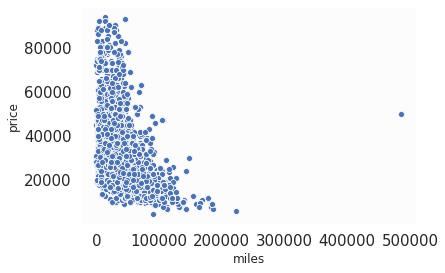

In [109]:
# Miles
# Lets see if miles has any outliers
ax = sns.scatterplot(x="miles", y="price", data=df_bs)
ax.get_xaxis().get_major_formatter().set_scientific(False)
ax.get_yaxis().get_major_formatter().set_scientific(False)

In [110]:
# Remove outliers
df_bs=df_bs[(df_bs.miles < 300000) & (df_bs.miles > 1 )]

In [111]:
# Engine_block
# Change engine block of all electric cars to 'N/A'
df_bs.loc[df_bs.fuel_type == 'Electric', 'engine_block'] = 'N/A'

In [112]:
# Engine_size
# Change engine size of all electric cars to 0
df_bs.loc[df_bs.fuel_type == 'Electric', 'engine_size'] = 0

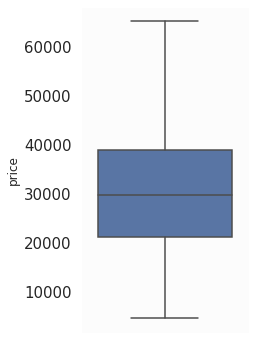

In [113]:
plt.figure(figsize=(3,6))
sns.boxplot(y='price', data=df_bs, showfliers=False);

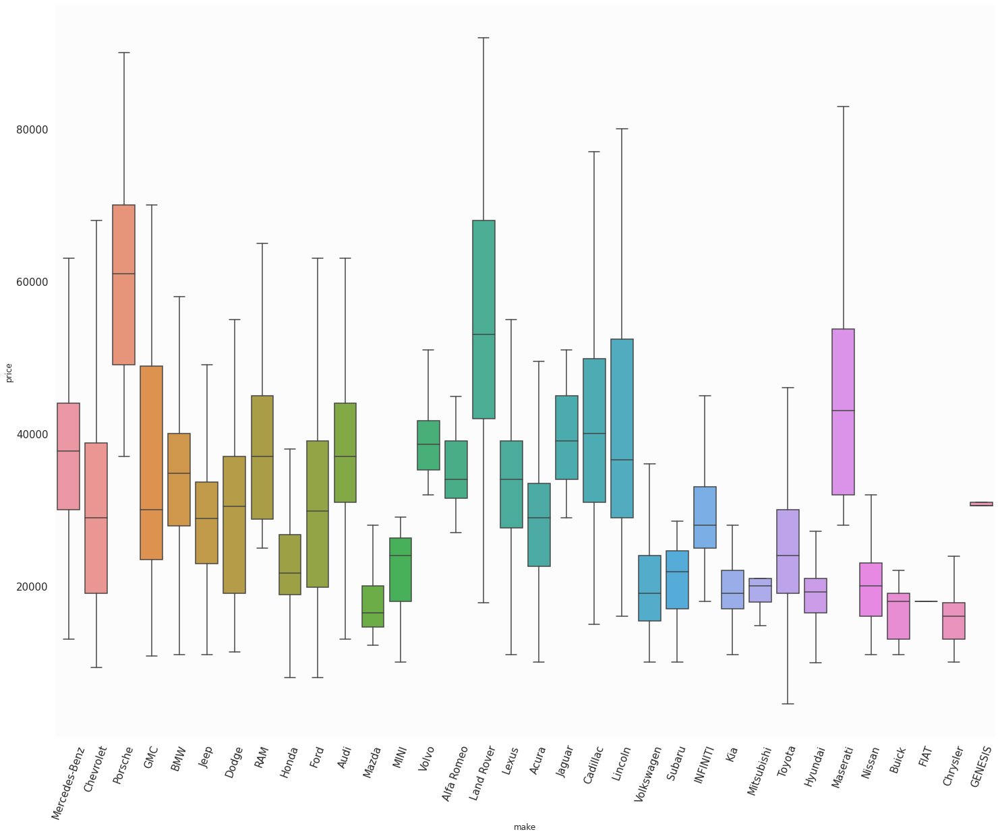

In [114]:
plt.figure(figsize=(25,20))
plt.xticks(rotation=70)
sns.boxplot(y='price', x='make', data=df_bs, showfliers=False)

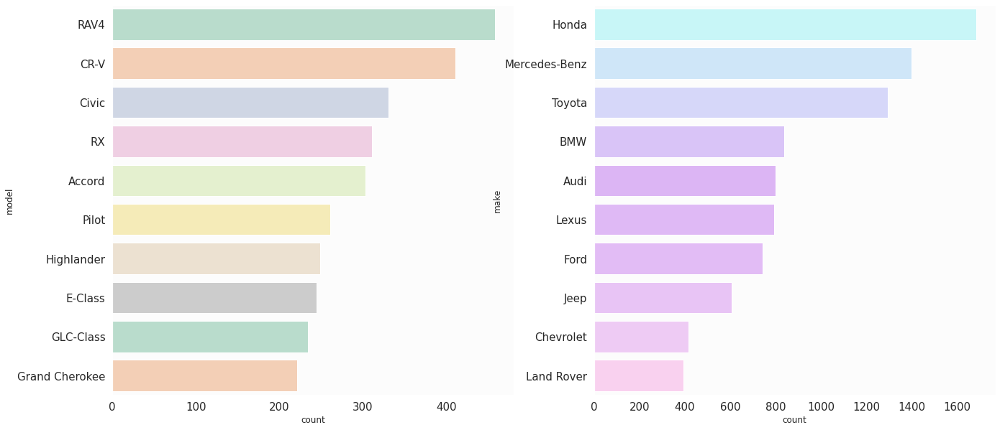

In [115]:
colors = ["#C0FDFF", "#C8E7FF","#D0D1FF","#D8BBFF","#DEAAFF","#E2AFFF","#E5B3FE","#ECBCFD","#F3C4FB","#FFCBF2"]
sns.set_palette(sns.color_palette(colors))


fig, ax =plt.subplots(1,2,figsize=(22, 10))
sns.set(rc={"axes.facecolor":"#fcfcfc", "axes.grid":False,'xtick.labelsize':20,'ytick.labelsize':20})
sns.countplot(y ='make',data = df_bs,order=df_bs.make.value_counts().iloc[:10].index, ax = ax[1],palette = colors) 
sns.countplot(y ='model',data = df_bs,order=df_bs.model.value_counts().iloc[:10].index, ax= ax[0],palette = "Pastel2")
fig.show()

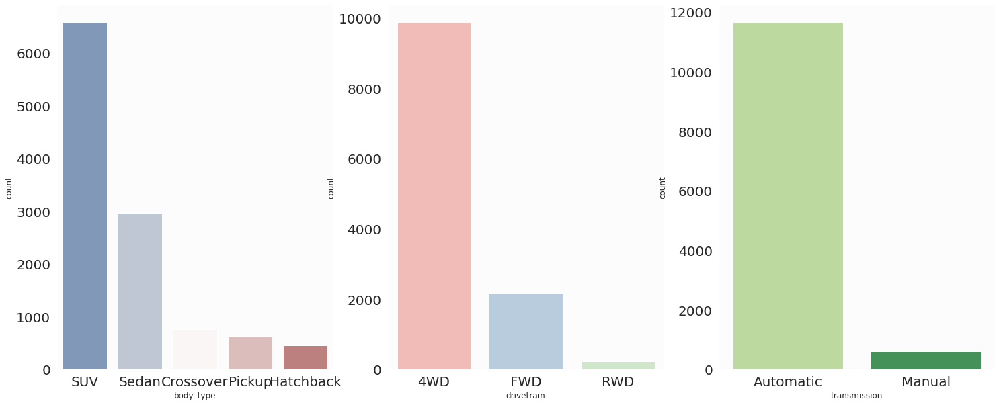

In [116]:
fig, ax =plt.subplots(1,3,figsize=(25, 10))
sns.set(rc={"axes.facecolor":"#fcfcfc", "axes.grid":False,'xtick.labelsize':15,'ytick.labelsize':15})
sns.countplot(x ='body_type',data = df_bs,order=df_bs.body_type.value_counts().iloc[:5].index, ax = ax[0],palette="vlag")
sns.countplot(x ='drivetrain',data = df_bs,order=df_bs.drivetrain.value_counts().iloc[:5].index, ax = ax[1],palette="Pastel1")
sns.countplot(x ='transmission',data = df_bs,order=df_bs.transmission.value_counts().iloc[:5].index, ax = ax[2],palette="YlGn")
fig.show()

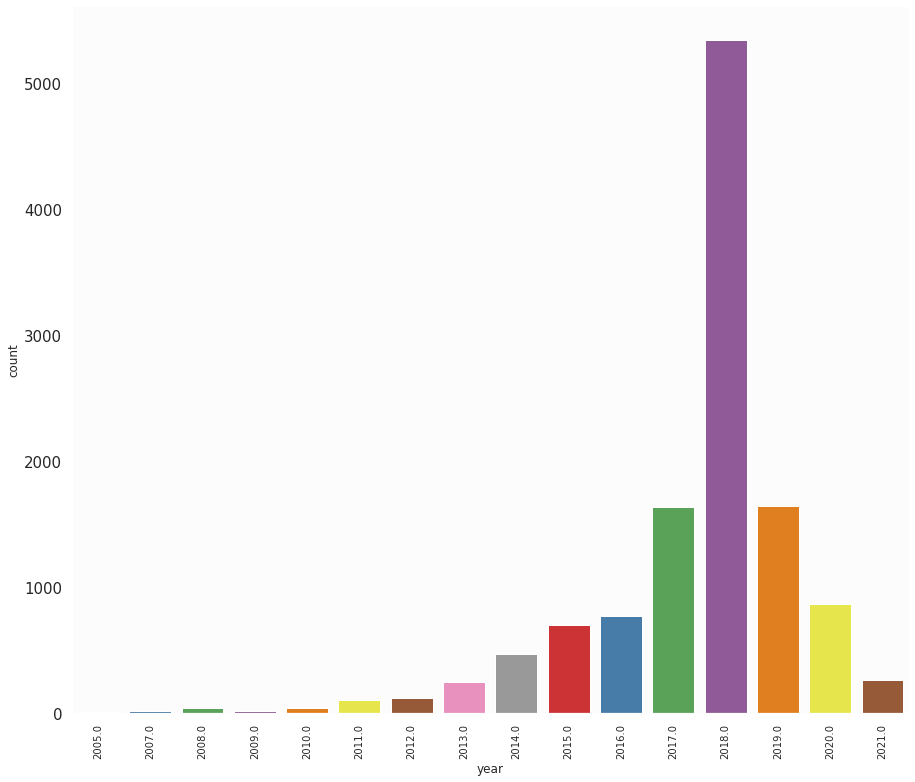

In [117]:
plt.figure(figsize=(15, 13))
ax = sns.countplot(x = 'year', data=df_bs, palette='Set1')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90,fontsize=10);

In [118]:
# Now lets deal with missing vehicle type, similarly we will replace missing vehicle type based on body_type:
df_bv = df_bs.groupby(['body_type','vehicle_type'], sort=True).size().reset_index(name='Count')
df_bv
# We can see that in most cases, each body_type corresponding to one vehicle type. Some outliers are probably entered by mistake.

,body_type,vehicle_type,Count
0,Cargo Van,Truck,63
1,Chassis Cab,Truck,10
2,Convertible,Car,64
3,Coupe,Car,468
4,Crossover,Car,9
5,Crossover,Truck,765
6,Hatchback,Car,468
7,Mini Mpv,Truck,7
8,Minivan,Truck,114
9,Passenger Van,Truck,16


In [119]:
df_bs = df_bs.drop(df_bs[(df_bs['body_type'] == 'Crossover') & (df_bs['vehicle_type'] == 'Car')].index)
df_bs = df_bs.drop(df_bs[(df_bs['body_type'] == 'SUV') & (df_bs['vehicle_type'] == 'Car')].index)

In [120]:
df_bs.make.value_counts().to_frame()

,make
Honda,1684
Mercedes-Benz,1397
Toyota,1284
BMW,823
Audi,798
Lexus,794
Ford,744
Jeep,606
Chevrolet,417
Land Rover,393


In [121]:
# Remove the car brands which have less than 20 samples. It will narrow the capability of our model, but in return lower the bias and variance.
rm_brands = ['FIAT', 'GENESIS']
for brand in rm_brands:
    df_bs = df_bs[~(df_bs['make'] == brand)]

In [122]:
profile3 = pp(df_bs)
profile3.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [123]:
profile2.to_file("profile_cleaned_bos.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [124]:
# Before we start to train the models, We also need to normalize the values in the numerical features ("year" ,"engine_size" "miles"), as they do not have the same scale.
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
num_vars= ['year', 'miles', 'engine_size']
df_tor[num_vars] = scaler.fit_transform(df_tor[num_vars])

In [125]:
# The first model we will implement is Linear Regression, however, linear regression can not handle categorical data directly. Thus, we need to apply encoding first.
# Most of our categorical features have more than two values. If we use LabelEncoder then these values will be treated as ordinal ones by the machine learning model. 
# In this case, we will select One-hot encoder, also called as dummy encoding, however, model feature has a high cardinality, we need to avoid curse of dimensionality
df_tor_lr = df_tor.copy()

In [126]:
!pip install feature_engine
from feature_engine.encoding import RareLabelEncoder as RareLabelCategoricalEncoder

  Using cached feature_engine-1.1.2-py2.py3-none-any.whl (180 kB)


In [127]:
# Upon further checking, a lot of the model only appear once in our dataset! So the approach we use here first is to use rarelabel encoder. All models that appear less than 20 times are labelled as 'Rare'. 
rare_encoder = RareLabelCategoricalEncoder(
    tol=0.0018,
    n_categories=10, variables=["model"])  

In [128]:
rare_encoder.fit(df_tor_lr)

RareLabelEncoder(ignore_format=False, max_n_categories=None, n_categories=10,
                 replace_with='Rare', tol=0.0018, variables=['model'])

In [129]:
df_tor_lr = rare_encoder.transform(df_tor_lr)

In [130]:
# Define a function to generate dummy variables and mergek it with data frame

def dummies(x,df):
    temp = pd.get_dummies(df[[x]], drop_first=True)
    df = pd.concat([df,temp], axis=1)
    df.drop([x], axis=1, inplace=True)
    return df

# Apply function to the cars_new df
df_tor_lr = dummies('make', df_tor_lr)
df_tor_lr = dummies('model', df_tor_lr)
df_tor_lr = dummies('body_type', df_tor_lr)
df_tor_lr = dummies('vehicle_type', df_tor_lr)
df_tor_lr = dummies('drivetrain', df_tor_lr)
df_tor_lr = dummies('transmission', df_tor_lr)
df_tor_lr = dummies('fuel_type', df_tor_lr)
df_tor_lr = dummies('engine_block', df_tor_lr)


In [131]:
df_tor_lr.head()

,price,miles,year,engine_size,make_Audi,make_BMW,make_Buick,make_Cadillac,make_Chevrolet,make_Chrysler,...,fuel_type_Electric / E85,fuel_type_Electric / Premium Unleaded,fuel_type_Electric / Unleaded,fuel_type_Premium Unleaded,fuel_type_Premium Unleaded / Unleaded,fuel_type_Unleaded,fuel_type_Unleaded / Unleaded,engine_block_I,engine_block_N/A,engine_block_V
446,39455.0,0.290890,0.869565,0.684932,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
732,6450.0,0.736667,0.391304,0.739726,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
992,24962.0,0.177380,0.869565,0.205479,0,0,0,0,1,0,...,0,1,0,0,0,0,0,1,0,0
993,24962.0,0.172075,0.869565,0.205479,0,0,0,0,1,0,...,0,1,0,0,0,0,0,1,0,0
996,24962.0,0.172075,0.869565,0.205479,0,0,0,0,1,0,...,0,1,0,0,0,0,0,1,0,0


In [132]:
# Split train and test data using 8:2 ratio:
X_train, X_test, Y_train, Y_test = train_test_split(df_tor_lr.drop('price',axis=1), df_tor_lr['price'], test_size=0.20, random_state=141)

In [133]:
model_evaluation  = pd.DataFrame(columns=('r2', 'rmse'))

In [134]:
from sklearn.linear_model import LinearRegression
lrm = LinearRegression()
lrm.fit(X_train,Y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [135]:
# Overall the performence and accuracy is just mediocre with R2 score around 82%
from sklearn import metrics
lrm_predict = lrm.predict(X_test)

lrm_r2 = metrics.r2_score(Y_test, lrm_predict)
lrm_rmse = math.sqrt(metrics.mean_squared_error(Y_test, lrm_predict))

model_evaluation = model_evaluation.append(pd.DataFrame({'r2':[lrm_r2], 'rmse':[lrm_rmse]}, index = ['Linear Regression']))

print('For the linear regressor, the root mean square error for the testing set is:', lrm_rmse)
print('The r2 score for the testing set is:', lrm_r2)

For the linear regressor, the root mean square error for the testing set is: 5576.616035914864
The r2 score for the testing set is: 0.82619340703072


In [136]:
# To test whether it is overfitting, we calculate the score for the training set as well:
lrm_predict_train = lrm.predict(X_train)

lrm_r2_train = metrics.r2_score(Y_train, lrm_predict_train)
lrm_rmse_train = math.sqrt(metrics.mean_squared_error(Y_train, lrm_predict_train))

print('For the linear regressor, the root mean square error for the training set is:', lrm_rmse_train)
print('The r2 score for the testing set is:', lrm_r2_train)
# With similar rmse and r2 score, it seems that overfitting is not a probelm.

For the linear regressor, the root mean square error for the training set is: 5725.808257497235
The r2 score for the testing set is: 0.8217534983075683


In [137]:
# We will apply linear regression on Boston dataset as well and compare the difference:
scaler = MinMaxScaler()
num_vars= ['year', 'miles', 'engine_size']
df_bs[num_vars] = scaler.fit_transform(df_bs[num_vars])

In [138]:
df_bs_lr = df_bs.copy()

In [139]:
rare_encoder.fit(df_bs_lr)

RareLabelEncoder(ignore_format=False, max_n_categories=None, n_categories=10,
                 replace_with='Rare', tol=0.0018, variables=['model'])

In [140]:
df_bs_lr = rare_encoder.transform(df_bs_lr)

In [141]:
def dummies(x,df):
    temp = pd.get_dummies(df[[x]], drop_first=True)
    df = pd.concat([df,temp], axis=1)
    df.drop([x], axis=1, inplace=True)
    return df

# Apply function to the cars_new df
df_bs_lr = dummies('make', df_bs_lr)
df_bs_lr = dummies('model', df_bs_lr)
df_bs_lr = dummies('body_type', df_bs_lr)
df_bs_lr = dummies('vehicle_type', df_bs_lr)
df_bs_lr = dummies('drivetrain', df_bs_lr)
df_bs_lr = dummies('transmission', df_bs_lr)
df_bs_lr = dummies('fuel_type', df_bs_lr)
df_bs_lr = dummies('engine_block', df_bs_lr)

In [142]:
df_bs_lr.head()

,price,miles,year,engine_size,make_Alfa Romeo,make_Audi,make_BMW,make_Buick,make_Cadillac,make_Chevrolet,...,fuel_type_E85 / Premium Unleaded,fuel_type_E85 / Unleaded,fuel_type_E85 / Unleaded; Unleaded / Unleaded,fuel_type_Electric / Premium Unleaded,fuel_type_Electric / Premium Unleaded; Premium Unleaded,fuel_type_Electric / Unleaded,fuel_type_Premium Unleaded,fuel_type_Unleaded,engine_block_I,engine_block_V
141,22998.0,0.394358,0.5000,0.611940,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
512,10998.0,0.157576,0.6250,0.089552,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,1,0
882,58998.0,0.138755,0.8125,0.611940,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
3534,79998.0,0.047205,0.8750,0.343284,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
4772,58498.0,0.096166,0.7500,0.611940,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1


In [143]:
# Split train and test data using 8:2 ratio:
x_train, x_test, y_train, y_test = train_test_split(df_bs_lr.drop('price',axis=1), df_bs_lr['price'], test_size=0.20, random_state=141)

In [144]:
lrm2 = LinearRegression()
lrm2.fit(x_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [145]:
# The r2 score is higher and RMSE is somewhat similiar to toronto. 
lrm2_predict = lrm2.predict(x_test)

lrm2_r2 = metrics.r2_score(y_test, lrm2_predict)
lrm2_rmse = math.sqrt(metrics.mean_squared_error(y_test, lrm2_predict))

model_evaluation_bs = model_evaluation.append(pd.DataFrame({'r2':[lrm2_r2], 'rmse':[lrm2_rmse]}, index = ['Linear Regression']))

print('For the linear regressor, the root mean square error for the testing set is:', lrm2_rmse)
print('The r2 score for the testing set is:', lrm2_r2)

For the linear regressor, the root mean square error for the testing set is: 5122.596901444411
The r2 score for the testing set is: 0.8736260197642974


In [146]:
# Again, to test whether it is overfitting, we calculate the score for the training set as well:
lrm2_predict_train = lrm2.predict(x_train)

lrm2_r2_train = metrics.r2_score(y_train, lrm2_predict_train)
lrm2_rmse_train = math.sqrt(metrics.mean_squared_error(y_train, lrm2_predict_train))

print('For the linear regressor, the root mean square error for the training set is:', lrm2_rmse_train)
print('The r2 score for the testing set is:', lrm2_r2_train)
# With similar rmse and r2 score, it seems that overfitting is not a probelm.

For the linear regressor, the root mean square error for the training set is: 5304.935843152996
The r2 score for the testing set is: 0.8639902539603114


In [147]:
# Next we will apply more advanced methods on these two datasets: Random Forest and XGB